<a href="https://colab.research.google.com/github/faisal-ali472/Deep-Learning/blob/master/Neural_Network_Optimization_Pruning_%5BTensorflow%5D_Part_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Project:
The objectives of this project are to:
  - Find pruned sub networks in trained neural networks that are smaller and faster 
  - Verify if the pruned sub networks can achieve the same test accuracy as original with less computation and storage requirements
  
 Phases:
  1. Train a simple NN on MNIST to acheive >99% accuracy and find sub-networks with similar accuracy
  2. Train on larger and complex networks (i.e. VGG, Resnet, VAE, Transformer)
  
  
  Reference: https://www.tensorflow.org/model_optimization/guide/pruning

## Phase 1

In [0]:
! pip uninstall -y tensorflow
! pip uninstall -y tf-nightly
! pip install -q -U tf-nightly

! pip install -q tensorflow-model-optimization

Uninstalling tf-nightly-1.14.1.dev20190607:
  Successfully uninstalled tf-nightly-1.14.1.dev20190607


In [0]:
%load_ext tensorboard
import tensorboard

import tensorflow as tf
from tensorflow import keras
tf.enable_eager_execution()

import numpy as np
import tempfile
import zipfile
import os

## Design and Optimize a simple Feed-forward network

Load MNIST dataset for the experiment

In [0]:
batch_size = 128
num_classes = 10
epochs = 10
mnist = keras.datasets.mnist
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train, x_test = x_train/255.0, x_test/255.0

In [9]:
# design a basic Feed forward network
l = tf.keras.layers
layers = [   
    l.Flatten(input_shape=(28, 28)),
    l.Dense(512, activation=tf.nn.relu),
    l.Dense(256, activation=tf.nn.relu),
    l.Dense(128, activation=tf.nn.relu),
    l.Dense(10, activation=tf.nn.softmax), 
]

model = keras.Sequential(layers)
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_2 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_8 (Dense)              (None, 512)               401920    
_________________________________________________________________
dense_9 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_10 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_11 (Dense)             (None, 10)                1290      
Total params: 567,434
Trainable params: 567,434
Non-trainable params: 0
_________________________________________________________________


In [10]:
# train and evaluation original model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))

score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 5s 87us/sample - loss: 0.2357 - acc: 0.9312 - val_loss: 0.1210 - val_acc: 0.9632
Epoch 2/10
60000/60000 [==============================] - 5s 84us/sample - loss: 0.0883 - acc: 0.9726 - val_loss: 0.0788 - val_acc: 0.9755
Epoch 3/10
60000/60000 [==============================] - 5s 83us/sample - loss: 0.0552 - acc: 0.9828 - val_loss: 0.0700 - val_acc: 0.9779
Epoch 4/10
60000/60000 [==============================] - 5s 84us/sample - loss: 0.0416 - acc: 0.9867 - val_loss: 0.0789 - val_acc: 0.9771
Epoch 5/10
60000/60000 [==============================] - 5s 83us/sample - loss: 0.0300 - acc: 0.9903 - val_loss: 0.0748 - val_acc: 0.9799
Epoch 6/10
60000/60000 [==============================] - 5s 83us/sample - loss: 0.0266 - acc: 0.9913 - val_loss: 0.0798 - val_acc: 0.9771
Epoch 7/10
60000/60000 [==============================] - 5s 81us/sample - loss: 0.0231 - acc: 0.9928 - val_loss: 0.

### Model Pruning

In [11]:
import numpy as np

num_train_samples = x_train.shape[0]
end_step = np.ceil(1.0 * num_train_samples / batch_size).astype(np.int32) * epochs
print('End step: ' + str(end_step))

End step: 4690


In [12]:
# design same architecture as original model for pruning

pruning_params = {
      'pruning_schedule': sparsity.PolynomialDecay(initial_sparsity=0.50,
                                                   final_sparsity=0.95,
                                                   begin_step=2000,
                                                   end_step=end_step,
                                                   frequency=100)
}

pruning_layers = [   
    keras.layers.Flatten(input_shape=(28, 28)),
    sparsity.prune_low_magnitude(keras.layers.Dense(512, activation=tf.nn.relu), **pruning_params),
    sparsity.prune_low_magnitude(keras.layers.Dense(256, activation=tf.nn.relu), **pruning_params),
    sparsity.prune_low_magnitude(keras.layers.Dense(128, activation=tf.nn.relu), **pruning_params),
    sparsity.prune_low_magnitude(keras.layers.Dense(10, activation=tf.nn.softmax), **pruning_params),
]

pruned_model = keras.Sequential(pruning_layers)
pruned_model.summary()

W0611 17:15:13.757684 139985865148288 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_model_optimization/python/core/sparsity/keras/pruning_wrapper.py:185: Layer.add_variable (from tensorflow.python.keras.engine.base_layer) is deprecated and will be removed in a future version.
Instructions for updating:
Please use `layer.add_weight` method instead.
W0611 17:15:13.959534 139985865148288 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_model_optimization/python/core/sparsity/keras/pruning_schedule.py:240: div (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_3 (Flatten)          (None, 784)               0         
_________________________________________________________________
prune_low_magnitude_dense_12 (None, 512)               803330    
_________________________________________________________________
prune_low_magnitude_dense_13 (None, 256)               262402    
_________________________________________________________________
prune_low_magnitude_dense_14 (None, 128)               65666     
_________________________________________________________________
prune_low_magnitude_dense_15 (None, 10)                2572      
Total params: 1,133,970
Trainable params: 567,434
Non-trainable params: 566,536
_________________________________________________________________


In [13]:
logdir = tempfile.mkdtemp()
print('Writing training logs to ' + logdir)

pruned_model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

callbacks = [
    sparsity.UpdatePruningStep(),
    sparsity.PruningSummaries(log_dir=logdir, profile_batch=0)
]

pruned_model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          callbacks=callbacks,
          validation_data=(x_test, y_test))

score = pruned_model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Writing training logs to /tmp/tmpdvk02_a4
Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 6s 101us/sample - loss: 0.2198 - acc: 0.9338 - val_loss: 0.1040 - val_acc: 0.9666
Epoch 2/10
60000/60000 [==============================] - 5s 90us/sample - loss: 0.0823 - acc: 0.9746 - val_loss: 0.0790 - val_acc: 0.9751
Epoch 3/10
60000/60000 [==============================] - 5s 91us/sample - loss: 0.0535 - acc: 0.9832 - val_loss: 0.0748 - val_acc: 0.9776
Epoch 4/10
60000/60000 [==============================] - 5s 90us/sample - loss: 0.0391 - acc: 0.9870 - val_loss: 0.0904 - val_acc: 0.9741
Epoch 5/10
60000/60000 [==============================] - 6s 94us/sample - loss: 0.0286 - acc: 0.9915 - val_loss: 0.0545 - val_acc: 0.9818
Epoch 6/10
60000/60000 [==============================] - 6s 95us/sample - loss: 0.0268 - acc: 0.9916 - val_loss: 0.0690 - val_acc: 0.9796
Epoch 7/10
60000/60000 [==============================] - 6s 94us/sample 

### Comparing models
By visualizing weights at different layers and overall model size for original and pruned model.


Shape: (128, 10)
Shape: (128, 10)
Matrix Sparsity: 0.95


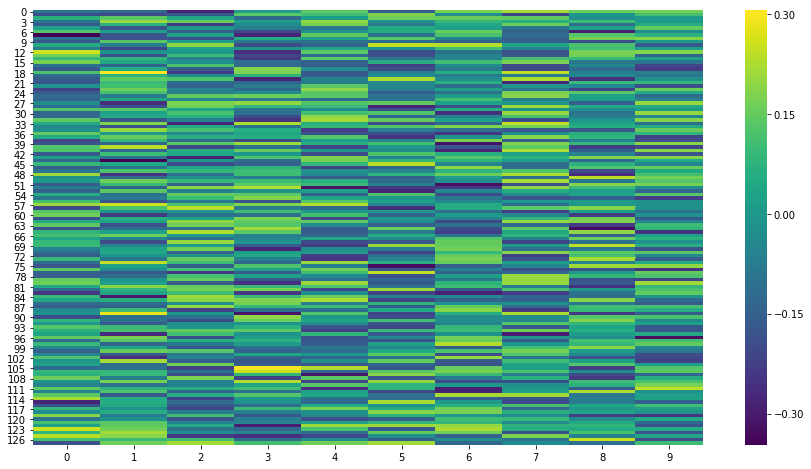

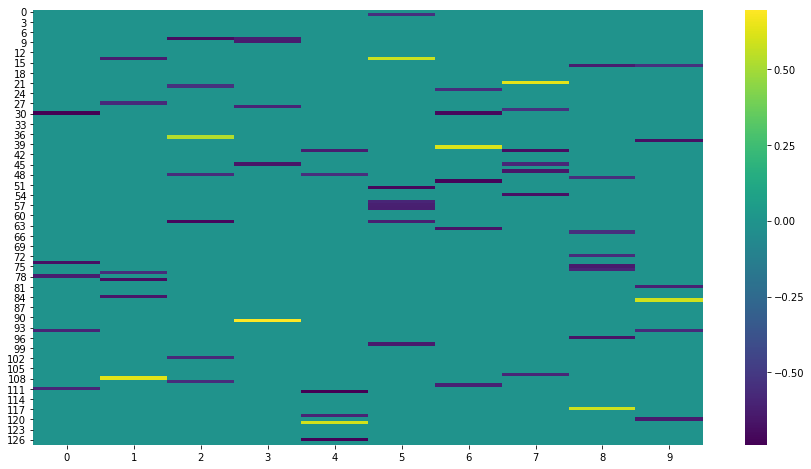

In [14]:
from matplotlib import pyplot as plt
import seaborn as sns

layer_number = 4

# visualize unpruned layer weights
layer = model.layers[layer_number]
weights = layer.get_weights()[0]

print("Shape: {}".format(weights.shape))
plt.figure(figsize=(15,8))
sns.heatmap(weights, cmap='viridis')

# visualize pruned layer's weights
layer = pruned_model.layers[layer_number]
weights = layer.get_weights()[0]

print("Shape: {}".format(weights.shape))
plt.figure(figsize=(15,8))
sns.heatmap(weights, cmap='viridis')


# calculate pruned layers sparsity
total_elements = weights.shape[0] * weights.shape[1]
nonzero_elements = np.count_nonzero(weights) #  (weights.nonzero()[0])
zero_elements = total_elements - nonzero_elements

matrix_sparsity = 1 - (nonzero_elements / total_elements)
print("Matrix Sparsity: {}".format(matrix_sparsity))

In [15]:
filename = "_basic_fnn_pruned.h5"

stripped_model = sparsity.strip_pruning(pruned_model)

_, filepath = tempfile.mkstemp(filename)
print('Saving pruned model to: ', filepath)

# No need to save the optimizer with the graph for serving.
tf.keras.models.save_model(stripped_model, filepath, include_optimizer=False)


_, zip1 = tempfile.mkstemp('.zip') 
with zipfile.ZipFile(zip1, 'w', compression=zipfile.ZIP_DEFLATED) as f:
  f.write(filepath)
print("Size of the unpruned model before compression: %.4f Mb" % 
      (os.path.getsize(filepath) / float(2**20)))
print("Size of the unpruned model after compression: %.4f Mb" % 
      (os.path.getsize(zip1) / float(2**20)))


# final_model = sparsity.strip_pruning(pruned_model)
# final_model.summary()


Saving pruned model to:  /tmp/tmp2a0lwjw6_basic_fnn_pruned.h5
Size of the unpruned model before compression: 2.1832 Mb
Size of the unpruned model after compression: 0.2973 Mb


## Design and Optimize a simple Convolution network

In [3]:
batch_size = 128
num_classes = 10
epochs = 10

# input image dimensions
img_rows, img_cols = 28, 28

# the data, shuffled and split between train and test sets
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

if tf.keras.backend.image_data_format() == 'channels_first':
  x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
  x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
  input_shape = (1, img_rows, img_cols)
else:
  x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
  x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
  input_shape = (img_rows, img_cols, 1)

x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255
x_test /= 255
print('x_train shape:', x_train.shape)
print(x_train.shape[0], 'train samples')
print(x_test.shape[0], 'test samples')

# convert class vectors to binary class matrices
y_train = tf.keras.utils.to_categorical(y_train, num_classes)
y_test = tf.keras.utils.to_categorical(y_test, num_classes)


x_train shape: (60000, 28, 28, 1)
60000 train samples
10000 test samples


In [0]:
l = tf.keras.layers

model = tf.keras.Sequential([
    l.Conv2D(
        32, 5, padding='same', activation='relu', input_shape=input_shape),
    l.MaxPooling2D((2, 2), (2, 2), padding='same'),
    l.BatchNormalization(),
    l.Conv2D(64, 5, padding='same', activation='relu'),
    l.MaxPooling2D((2, 2), (2, 2), padding='same'),
    l.Flatten(),
    l.Dense(1024, activation='relu'),
    l.Dropout(0.4),
    l.Dense(num_classes, activation='softmax')
])

model.summary()


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 28, 28, 32)        832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 14, 14, 32)        0         
_________________________________________________________________
batch_normalization (BatchNo (None, 14, 14, 32)        128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 14, 14, 64)        51264     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
flatten (Flatten)            (None, 3136)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              3

In [0]:
logdir = tempfile.mkdtemp()
print('Writing training logs to ' + logdir)


Writing training logs to /tmp/tmprjx_j5ms


In [0]:
%tensorboard --logdir={logdir}

Reusing TensorBoard on port 6006 (pid 532), started 0:26:29 ago. (Use '!kill 532' to kill it.)

In [0]:
# !tensorboard --inspect --logdir /tmp/tmprjx_j5ms

In [0]:
callbacks = [tf.keras.callbacks.TensorBoard(log_dir=logdir, profile_batch=0)]

model.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer='adam',
    metrics=['accuracy'])

model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          callbacks=callbacks,
          validation_data=(x_test, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


W0607 13:33:46.112122 140395558610816 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_core/python/ops/math_grad.py:1251: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 145s 2ms/sample - loss: 0.2099 - acc: 0.9454 - val_loss: 0.0951 - val_acc: 0.9877
Epoch 2/10
60000/60000 [==============================] - 142s 2ms/sample - loss: 0.0466 - acc: 0.9852 - val_loss: 0.0309 - val_acc: 0.9899
Epoch 3/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0326 - acc: 0.9901 - val_loss: 0.0301 - val_acc: 0.9900
Epoch 4/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0255 - acc: 0.9915 - val_loss: 0.0257 - val_acc: 0.9924
Epoch 5/10
60000/60000 [==============================] - 140s 2ms/sample - loss: 0.0211 - acc: 0.9931 - val_loss: 0.0197 - val_acc: 0.9934
Epoch 6/10
60000/60000 [==============================] - 140s 2ms/sample - loss: 0.0170 - acc: 0.9947 - val_loss: 0.0291 - val_acc: 0.9902
Epoch 7/10
60000/60000 [==============================] - 140s 2ms/sample - loss: 0.0179 - acc: 0.9945 - val_l

In [0]:
# Backend agnostic way to save/restore models
_, keras_file = tempfile.mkstemp('.h5')
print('Saving model to: ', keras_file)
tf.keras.models.save_model(model, keras_file, include_optimizer=False)


Saving model to:  /tmp/tmptiwdieiw.h5


### Model Pruning

In [1]:
from tensorflow_model_optimization.sparsity import keras as sparsity

W0611 12:23:27.133137 139985865148288 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-packages/tensorflow/__init__.py:97: The name tf.AUTO_REUSE is deprecated. Please use tf.compat.v1.AUTO_REUSE instead.

W0611 12:23:27.134422 139985865148288 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-packages/tensorflow/__init__.py:97: The name tf.AttrValue is deprecated. Please use tf.compat.v1.AttrValue instead.

W0611 12:23:27.137837 139985865148288 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-packages/tensorflow/__init__.py:97: The name tf.COMPILER_VERSION is deprecated. Please use tf.version.COMPILER_VERSION instead.

W0611 12:23:27.140318 139985865148288 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-packages/tensorflow/__init__.py:97: The name tf.CXX11_ABI_FLAG is deprecated. Please use tf.sysconfig.CXX11_ABI_FLAG instead.

W0611 12:23:27.142042 139985865148288 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-pac

In [0]:
import numpy as np

epochs = 12
num_train_samples = x_train.shape[0]
end_step = np.ceil(1.0 * num_train_samples / batch_size).astype(np.int32) * epochs
print('End step: ' + str(end_step))


End step: 2345


In [0]:
pruning_params = {
      'pruning_schedule': sparsity.PolynomialDecay(initial_sparsity=0.50,
                                                   final_sparsity=0.90,
                                                   begin_step=2000,
                                                   end_step=end_step,
                                                   frequency=100)
}

pruned_model = tf.keras.Sequential([
    sparsity.prune_low_magnitude(
        l.Conv2D(32, 5, padding='same', activation='relu'),
        input_shape=input_shape,
        **pruning_params),
    l.MaxPooling2D((2, 2), (2, 2), padding='same'),
    l.BatchNormalization(),
    sparsity.prune_low_magnitude(
        l.Conv2D(64, 5, padding='same', activation='relu'), **pruning_params),
    l.MaxPooling2D((2, 2), (2, 2), padding='same'),
    l.Flatten(),
    sparsity.prune_low_magnitude(l.Dense(1024, activation='relu'),
                                 **pruning_params),
    l.Dropout(0.4),
    sparsity.prune_low_magnitude(l.Dense(num_classes, activation='softmax'),
                                 **pruning_params)
])

pruned_model.summary()


W0607 14:04:06.347162 140395558610816 deprecation_wrapper.py:118] From /usr/local/lib/python3.6/dist-packages/tensorflow_estimator/python/estimator/api/_v1/estimator/__init__.py:10: The name tf.estimator.inputs is deprecated. Please use tf.compat.v1.estimator.inputs instead.

W0607 14:04:06.580063 140395558610816 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow_model_optimization/python/core/sparsity/keras/pruning_schedule.py:240: div (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
prune_low_magnitude_conv2d_2 (None, 28, 28, 32)        1634      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 32)        128       
_________________________________________________________________
prune_low_magnitude_conv2d_3 (None, 14, 14, 64)        102466    
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 3136)              0         
_________________________________________________________________
prune_low_magnitude_dense_2  (None, 1024)             

In [0]:
logdir = tempfile.mkdtemp()
print('Writing training logs to ' + logdir)


Writing training logs to /tmp/tmp0v5mb6z_


In [0]:
%tensorboard --logdir={logdir}

Reusing TensorBoard on port 6007 (pid 1200), started 0:30:47 ago. (Use '!kill 1200' to kill it.)

In [0]:
pruned_model.compile(
    loss=tf.keras.losses.categorical_crossentropy,
    optimizer='adam',
    metrics=['accuracy'])

# Add a pruning step callback to peg the pruning step to the optimizer's
# step. Also add a callback to add pruning summaries to tensorboard
callbacks = [
    sparsity.UpdatePruningStep(),
    sparsity.PruningSummaries(log_dir=logdir, profile_batch=0)
]

pruned_model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=10,
          verbose=1,
          callbacks=callbacks,
          validation_data=(x_test, y_test))

score = pruned_model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 60000 samples, validate on 10000 samples
Epoch 1/10
60000/60000 [==============================] - 146s 2ms/sample - loss: 0.1710 - acc: 0.9510 - val_loss: 0.1246 - val_acc: 0.9836
Epoch 2/10
60000/60000 [==============================] - 143s 2ms/sample - loss: 0.0465 - acc: 0.9855 - val_loss: 0.0387 - val_acc: 0.9880
Epoch 3/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0331 - acc: 0.9898 - val_loss: 0.0340 - val_acc: 0.9884
Epoch 4/10
60000/60000 [==============================] - 140s 2ms/sample - loss: 0.0262 - acc: 0.9916 - val_loss: 0.0270 - val_acc: 0.9914
Epoch 5/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0193 - acc: 0.9938 - val_loss: 0.0223 - val_acc: 0.9933
Epoch 6/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0155 - acc: 0.9949 - val_loss: 0.0254 - val_acc: 0.9922
Epoch 7/10
60000/60000 [==============================] - 141s 2ms/sample - loss: 0.0158 - acc: 0.9949 - val_l

In [0]:
_, checkpoint_file = tempfile.mkstemp('.h5')
print('Saving pruned model to: ', checkpoint_file)
# saved_model() sets include_optimizer to True by default. Spelling it out here
# to highlight.
tf.keras.models.save_model(pruned_model, checkpoint_file, include_optimizer=True)

with sparsity.prune_scope():
  restored_model = tf.keras.models.load_model(checkpoint_file)

restored_model.fit(x_train, y_train,
                   batch_size=batch_size,
                   epochs=2,
                   verbose=1,
                   callbacks=callbacks,
                   validation_data=(x_test, y_test))

score = restored_model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Saving pruned model to:  /tmp/tmprfpeq7_0.h5
Train on 60000 samples, validate on 10000 samples
Epoch 1/2
60000/60000 [==============================] - 150s 3ms/sample - loss: 0.0110 - acc: 0.9965 - val_loss: 0.0203 - val_acc: 0.9935
Epoch 2/2
60000/60000 [==============================] - 147s 2ms/sample - loss: 0.0075 - acc: 0.9976 - val_loss: 0.0266 - val_acc: 0.9929
Test loss: 0.02660255995906764
Test accuracy: 0.9929


In [0]:
# Strip the pruning wrappers from the pruned model before export for serving
final_model = sparsity.strip_pruning(pruned_model)
final_model.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 28, 28, 32)        832       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 32)        128       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 14, 14, 64)        51264     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 3136)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)             

In [0]:
_, pruned_keras_file = tempfile.mkstemp('.h5')
print('Saving pruned model to: ', pruned_keras_file)

# No need to save the optimizer with the graph for serving.
tf.keras.models.save_model(final_model, pruned_keras_file, include_optimizer=False)


Saving pruned model to:  /tmp/tmp0ivwc6yz.h5


### Compare models

In [0]:
_, zip1 = tempfile.mkstemp('.zip') 
with zipfile.ZipFile(zip1, 'w', compression=zipfile.ZIP_DEFLATED) as f:
  f.write(keras_file)
print("Size of the unpruned model before compression: %.2f Mb" % 
      (os.path.getsize(keras_file) / float(2**20)))
print("Size of the unpruned model after compression: %.2f Mb" % 
      (os.path.getsize(zip1) / float(2**20)))

_, zip2 = tempfile.mkstemp('.zip') 
with zipfile.ZipFile(zip2, 'w', compression=zipfile.ZIP_DEFLATED) as f:
  f.write(pruned_keras_file)
print("Size of the pruned model before compression: %.2f Mb" % 
      (os.path.getsize(pruned_keras_file) / float(2**20)))
print("Size of the pruned model after compression: %.2f Mb" % 
      (os.path.getsize(zip2) / float(2**20)))


Size of the unpruned model before compression: 12.52 Mb
Size of the unpruned model after compression: 11.59 Mb
Size of the pruned model before compression: 12.52 Mb
Size of the pruned model after compression: 2.52 Mb
